<a href="https://colab.research.google.com/github/ritwiks9635/CNN_Project_File/blob/main/Image_Super_Resolution_using_an_Efficient_Sub_Pixel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Image Super-Resolution using an Efficient Sub-Pixel**

#**Introduction**
ESPCN (Efficient Sub-Pixel CNN), proposed by Shi, 2016 is a model that reconstructs a high-resolution version of an image given a low-resolution version. It leverages efficient "sub-pixel convolution" layers, which learns an array of image upscaling filters.

In [ ]:
! unzip /content/https:/www.kaggle.com/datasets/jesucristo/super-resolution-benchmarks/super-resolution-benchmarks.zip

In [ ]:
!pip install keras --upgrade

In [4]:
import keras
from keras import layers
from keras import ops
from keras.utils import load_img
from keras.utils import array_to_img
from keras.utils import img_to_array
from keras.preprocessing import image_dataset_from_directory
import tensorflow as tf  #  only for data preprocessing

import os
import math
import numpy as np

from IPython.display import display

In [5]:
ROOT_DIR = "/content/BSDS200/BSDS200"
crop_size = 300
upscale_factor = 3
input_size = crop_size // upscale_factor
batch_size = 8

train_ds = image_dataset_from_directory(
    ROOT_DIR,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="training",
    seed=1337,
    label_mode=None,
)

valid_ds = image_dataset_from_directory(
    ROOT_DIR,
    batch_size=batch_size,
    image_size=(crop_size, crop_size),
    validation_split=0.2,
    subset="validation",
    seed=1337,
    label_mode=None,
)

Found 200 files.
Using 160 files for training.
Found 200 files.
Using 40 files for validation.


In [6]:
def scaling(input_image):
    input_image = input_image / 255.0
    return input_image

train_ds = train_ds.map(scaling)
valid_ds = valid_ds.map(scaling)

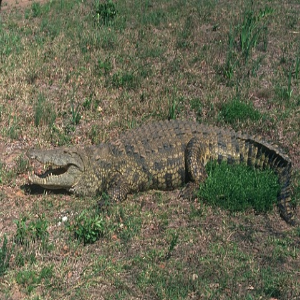

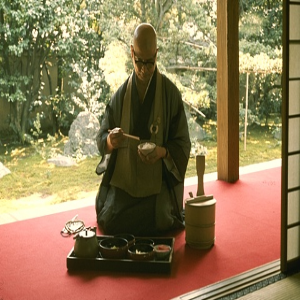

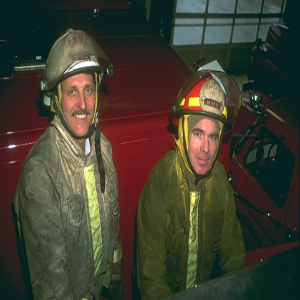

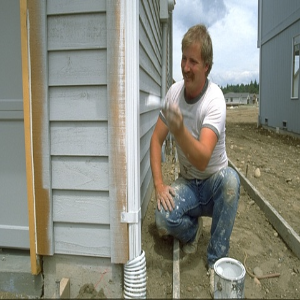

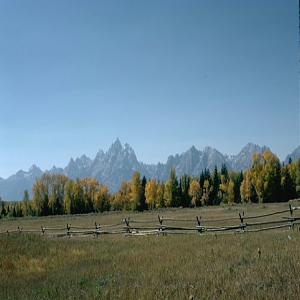

...

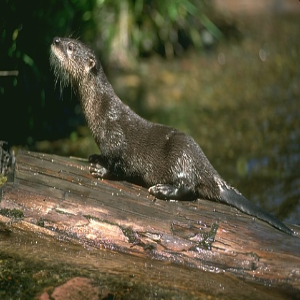

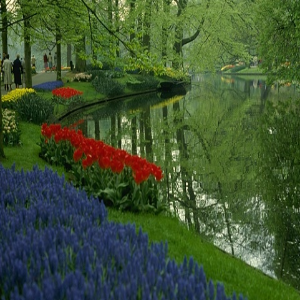

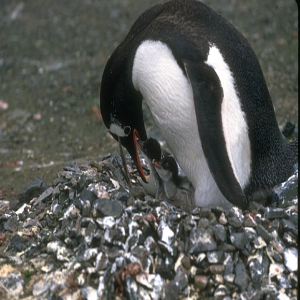

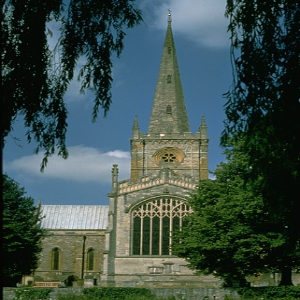

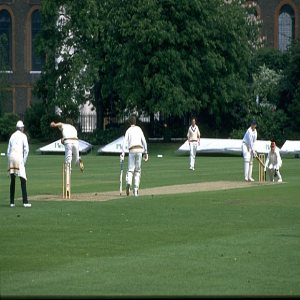

In [7]:
for batchs in train_ds.take(5):
    for batch in batchs:
        display(array_to_img(batch))

#**Crop and resize images**

In [8]:
# Use TF Ops to process.
def process_input(input, input_size, upscale_factor):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return tf.image.resize(y, [input_size, input_size], method="area")


def process_target(input):
    input = tf.image.rgb_to_yuv(input)
    last_dimension_axis = len(input.shape) - 1
    y, u, v = tf.split(input, 3, axis=last_dimension_axis)
    return y


train_ds = train_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
train_ds = train_ds.prefetch(buffer_size=32)

valid_ds = valid_ds.map(
    lambda x: (process_input(x, input_size, upscale_factor), process_target(x))
)
valid_ds = valid_ds.prefetch(buffer_size=32)

In [20]:
test_path = "/content/CBSD68/CBSD68"

test_img_paths = sorted([os.path.join(test_path, fname)
                for fname in os.listdir(test_path)
                if fname.endswith(".png")])
#len(test_img_paths)

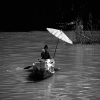

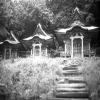

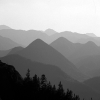

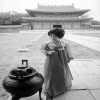

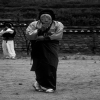

...

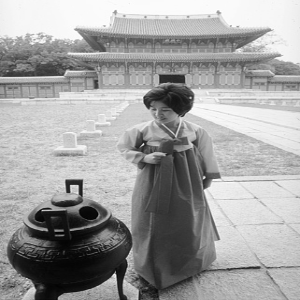

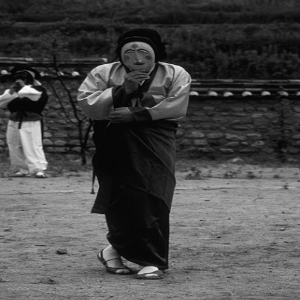

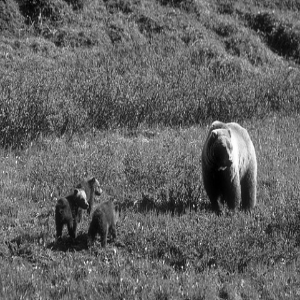

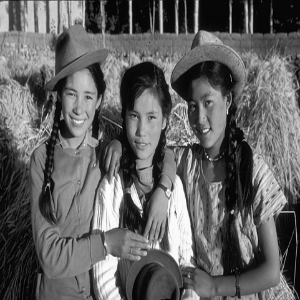

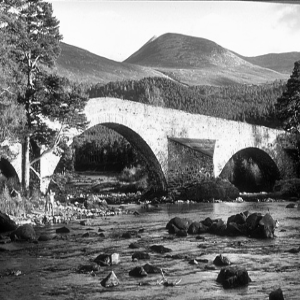

In [11]:
for batch in train_ds.take(1):
    for img in batch[0]:
        display(array_to_img(img))
    for img in batch[1]:
        display(array_to_img(img))

#**Build a model**

In [12]:
class DepthToSpace(layers.Layer):
    def __init__(self, block_size):
        super().__init__()
        self.block_size = block_size

    def call(self, input):
        batch, height, width, depth = ops.shape(input)
        depth = depth // (self.block_size**2)
        x = ops.reshape(input, [batch, height, width, self.block_size, self.block_size, depth])
        x = ops.transpose(x, [0, 1, 3, 2, 4, 5])
        x = ops.reshape(x, [batch, height * self.block_size, width * self.block_size, depth])
        return x

In [13]:
def get_model(upscale_factor = 3, channels = 1):
    conv_args = {
        "padding" : "same",
        "activation" : "relu",
        "kernel_initializer" : "orthogonal"
        }
    inputs = keras.Input(shape = (None, None, channels))
    x = layers.Conv2D(64, 5, **conv_args)(inputs)
    x = layers.Conv2D(64, 3, **conv_args)(x)
    x = layers.Conv2D(32, 3, **conv_args)(x)
    x = layers.Conv2D(channels * (upscale_factor**2), 3, **conv_args)(x)
    outputs = DepthToSpace(upscale_factor)(x)
    return keras.Model(inputs, outputs)

#**Define utility functions**

In [14]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
import PIL


def plot_results(img, prefix, title):
    """Plot the result with zoom-in area."""
    img_array = img_to_array(img)
    img_array = img_array.astype("float32") / 255.0

    # Create a new figure with a default 111 subplot.
    fig, ax = plt.subplots()
    im = ax.imshow(img_array[::-1], origin="lower")

    plt.title(title)
    # zoom-factor: 2.0, location: upper-left
    axins = zoomed_inset_axes(ax, 2, loc=2)
    axins.imshow(img_array[::-1], origin="lower")

    # Specify the limits.
    x1, x2, y1, y2 = 200, 300, 100, 200
    # Apply the x-limits.
    axins.set_xlim(x1, x2)
    # Apply the y-limits.
    axins.set_ylim(y1, y2)

    plt.yticks(visible=False)
    plt.xticks(visible=False)

    # Make the line.
    mark_inset(ax, axins, loc1=1, loc2=3, fc="none", ec="blue")
    plt.savefig(str(prefix) + "-" + title + ".png")
    plt.show()


def get_lowres_image(img, upscale_factor):
    """Return low-resolution image to use as model input."""
    return img.resize(
        (img.size[0] // upscale_factor, img.size[1] // upscale_factor),
        PIL.Image.BICUBIC,
    )


def upscale_image(model, img):
    """Predict the result based on input image and restore the image as RGB."""
    ycbcr = img.convert("YCbCr")
    y, cb, cr = ycbcr.split()
    y = img_to_array(y)
    y = y.astype("float32") / 255.0

    input = np.expand_dims(y, axis=0)
    out = model.predict(input)

    out_img_y = out[0]
    out_img_y *= 255.0

    # Restore the image in RGB color space.
    out_img_y = out_img_y.clip(0, 255)
    out_img_y = out_img_y.reshape((np.shape(out_img_y)[0], np.shape(out_img_y)[1]))
    out_img_y = PIL.Image.fromarray(np.uint8(out_img_y), mode="L")
    out_img_cb = cb.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img_cr = cr.resize(out_img_y.size, PIL.Image.BICUBIC)
    out_img = PIL.Image.merge("YCbCr", (out_img_y, out_img_cb, out_img_cr)).convert(
        "RGB"
    )
    return out_img

#**Define callbacks to monitor training**

In [15]:
class ESPCNCallback(keras.callbacks.Callback):
    def __init__(self):
        super().__init__()
        self.test_img = get_lowres_image(load_img(test_img_paths[0]), upscale_factor)

    # Store PSNR value in each epoch.
    def on_epoch_begin(self, epoch, logs=None):
        self.psnr = []

    def on_epoch_end(self, epoch, logs=None):
        print("Mean PSNR for epoch: %.2f" % (np.mean(self.psnr)))
        if epoch % 20 == 0:
            prediction = upscale_image(self.model, self.test_img)
            plot_results(prediction, "epoch-" + str(epoch), "prediction")

    def on_test_batch_end(self, batch, logs=None):
        self.psnr.append(10 * math.log10(1 / logs["loss"]))

In [21]:
early_stopping_cb = keras.callbacks.EarlyStopping(monitor = "loss", patience = 10)

checkpoint_path = "/model/checkpoint.keras"
model_checkpoint = keras.callbacks.ModelCheckpoint(
        checkpoint_path,
        monitor = "loss",
        mode = "min",
        save_best_only = True,
        save_weights_only = False)

callbacks = [ESPCNCallback(), early_stopping_cb, model_checkpoint]

model = get_model(upscale_factor = upscale_factor, channels = 1)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Layer (type)                       ┃ Output Shape                  ┃     Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ input_layer (InputLayer)           │ (None, None, None, 1)         │           0 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d (Conv2D)                    │ (None, None, None, 64)        │       1,664 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_1 (Conv2D)                  │ (None, None, None, 64)        │      36,928 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_2 (Conv2D)                  │ (None, None, None, 32)        │      18,464 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ conv2d_3 (Conv2D)                  │ (None, None, None, 9)         │       2,601 │
├────────────────────────────────────┼───────────────────────────────┼─────────────┤
│ depth_to_space (DepthToSpace)      │ (None, None, None, 1)         │           0 │
└────────────────────────────────────┴───────────────────────────────┴─────────────┘

 Total params: 59,657 (233.04 KB)

 Trainable params: 59,657 (233.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0092Mean PSNR for epoch: 25.65
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step


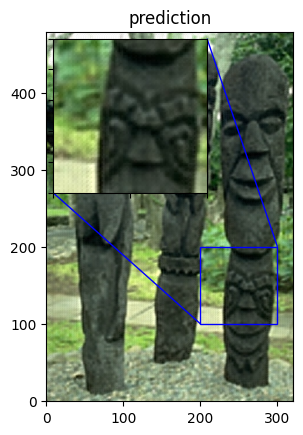

20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 82ms/step - loss: 0.0091 - val_loss: 0.0029
Epoch 2/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0034Mean PSNR for epoch: 25.70
20/20 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - loss: 0.0033 - val_loss: 0.0028
Epoch 3/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0027Mean PSNR for epoch: 25.33
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - loss: 0.0027 - val_loss: 0.0027
Epoch 4/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0024Mean PSNR for epoch: 26.15
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0024 - val_loss: 0.0027
Epoch 5/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0024Mean PSNR for epoch: 25.87
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 6/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0027Mean PSNR for epoch: 26.30
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 67ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 7/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.0023Mean PSNR for epoch: 25.7

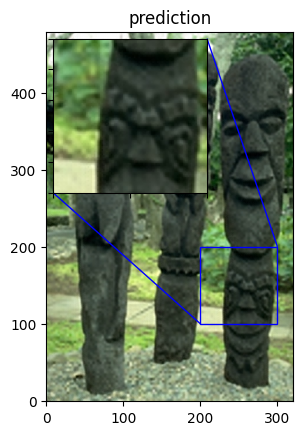

20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 95ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 22/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0025Mean PSNR for epoch: 25.71
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 23/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.0026Mean PSNR for epoch: 25.67
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 24/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.0026Mean PSNR for epoch: 25.56
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 25/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0024Mean PSNR for epoch: 26.88
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 26/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0026Mean PSNR for epoch: 25.42
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 27/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0026Mean PSNR for epoch

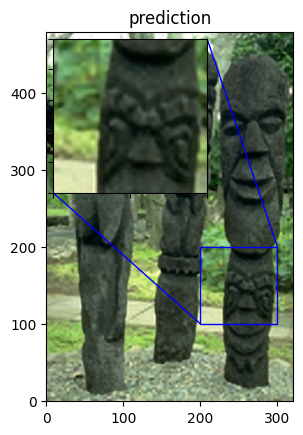

20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 89ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 42/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0028Mean PSNR for epoch: 26.15
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0028 - val_loss: 0.0026
Epoch 43/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0023Mean PSNR for epoch: 25.64
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 44/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0023Mean PSNR for epoch: 25.27
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 56ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 45/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.0024Mean PSNR for epoch: 25.66
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 46/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0022Mean PSNR for epoch: 26.26
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - loss: 0.0022 - val_loss: 0.0026
Epoch 47/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0023Mean PSNR for epoch

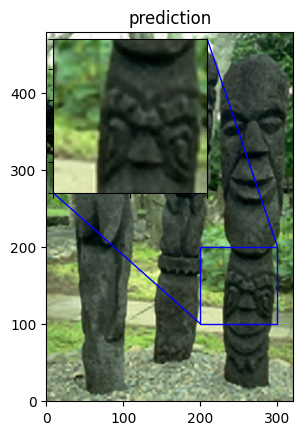

20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 79ms/step - loss: 0.0024 - val_loss: 0.0025
Epoch 62/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.0025Mean PSNR for epoch: 25.72
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - loss: 0.0025 - val_loss: 0.0025
Epoch 63/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0023Mean PSNR for epoch: 25.19
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.0023 - val_loss: 0.0026
Epoch 64/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 0.0024Mean PSNR for epoch: 26.43
20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - loss: 0.0024 - val_loss: 0.0026
Epoch 65/100
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.0025Mean PSNR for epoch: 26.69
20/20 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 0.0025 - val_loss: 0.0026
Epoch 66/100
18/20 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 0.0026Mean PSNR for epoch: 25.54
20/20 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - loss: 0.0026 - val_loss: 0.0026
Epoch 67/100
19/20 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 0.0024Mean PSNR for epoch

In [23]:
model.compile(
    optimizer = keras.optimizers.Adam(learning_rate = 0.001),
    loss = keras.losses.MeanSquaredError())

model.fit(train_ds, validation_data = valid_ds, epochs = 100, callbacks = callbacks)

#**Prediction and plot the results**

In [25]:
# The model weights (that are considered the best) are loaded into the model.
model.load_weights(checkpoint_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
PSNR of low resolution image and high resolution image is 21.9044
PSNR of predict and high resolution is 22.6216


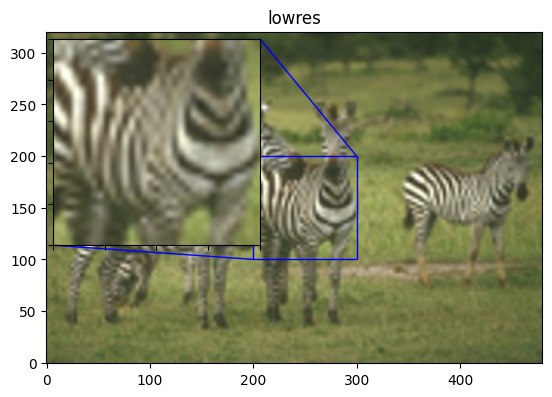

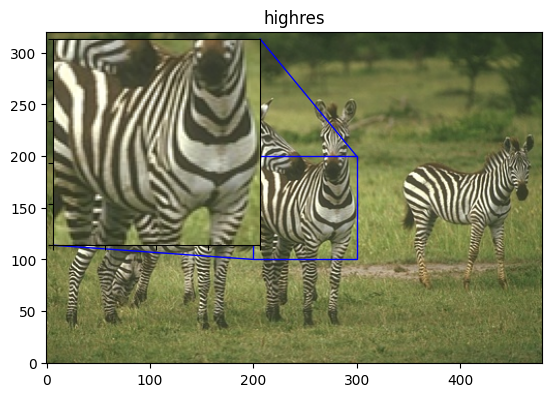

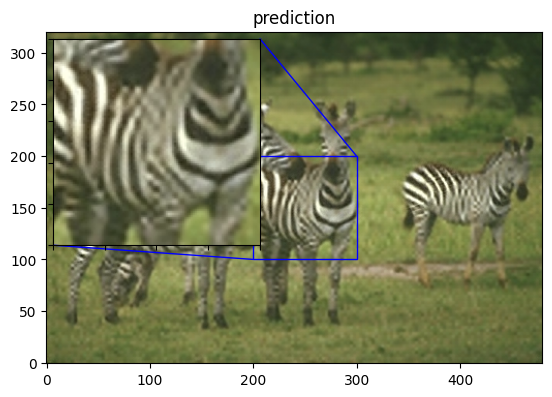

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
PSNR of low resolution image and high resolution image is 31.3020
PSNR of predict and high resolution is 30.9982


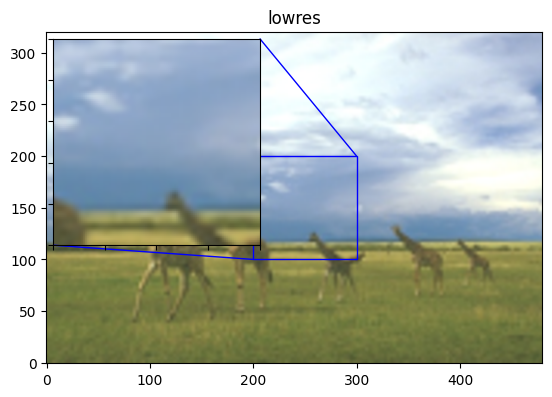

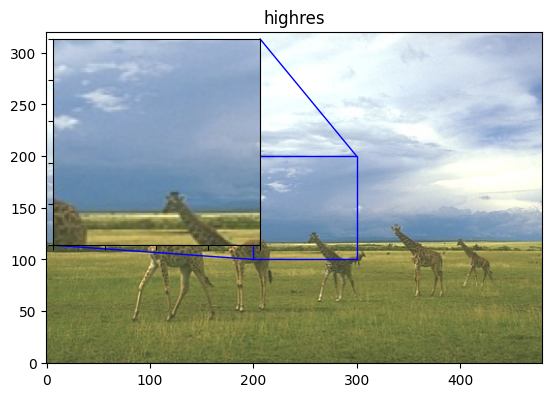

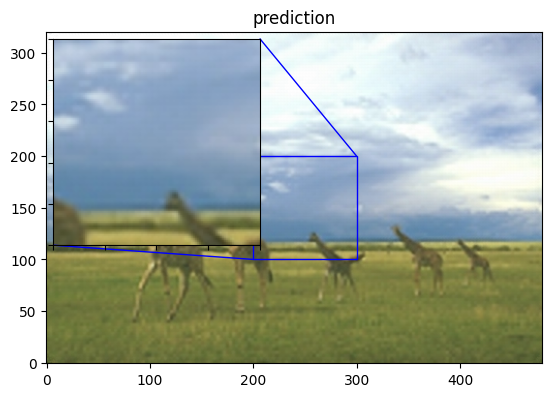

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
PSNR of low resolution image and high resolution image is 31.7682
PSNR of predict and high resolution is 31.3593


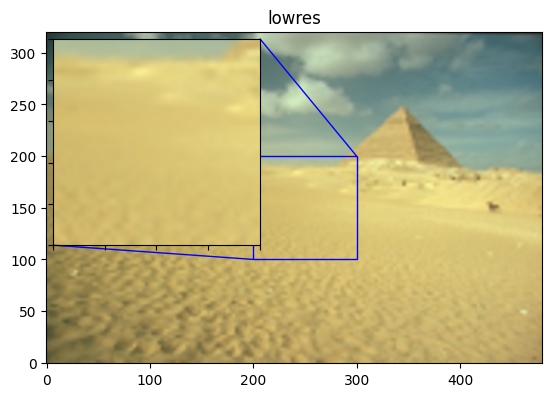

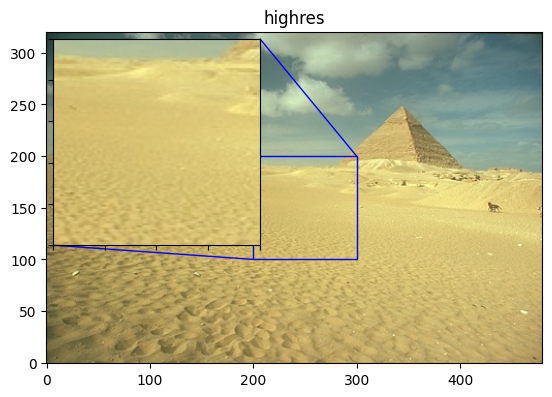

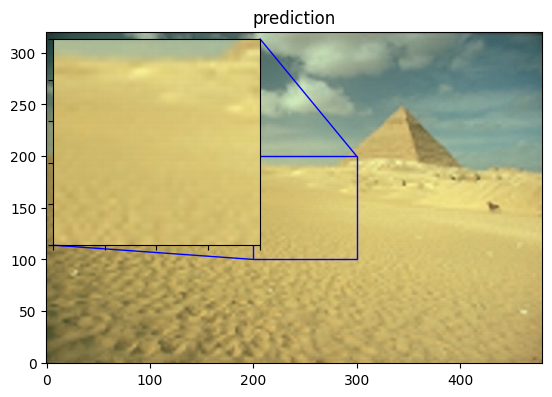

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
PSNR of low resolution image and high resolution image is 26.2665
PSNR of predict and high resolution is 26.9316


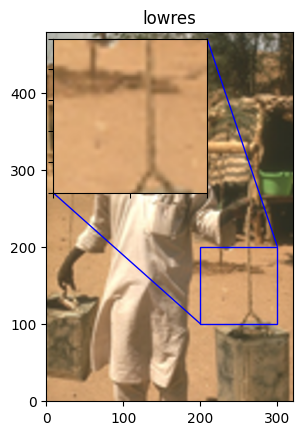

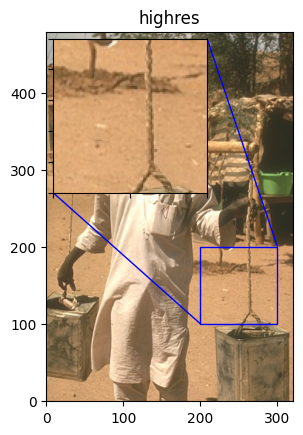

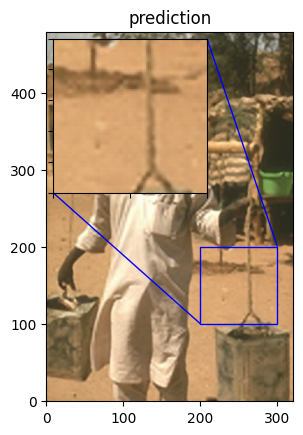

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
PSNR of low resolution image and high resolution image is 24.3042
PSNR of predict and high resolution is 25.1592


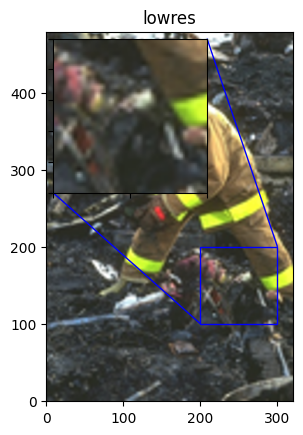

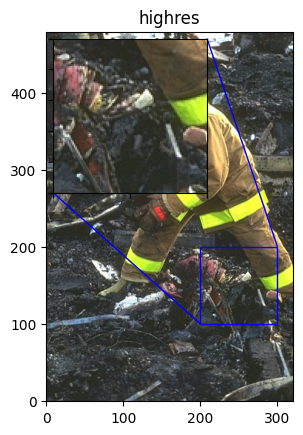

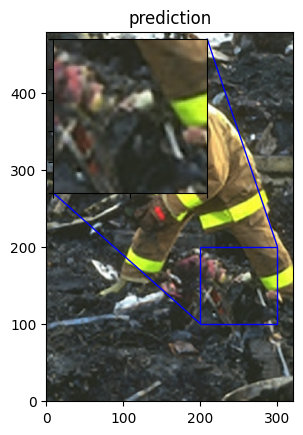

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 20.7968
PSNR of predict and high resolution is 21.0015


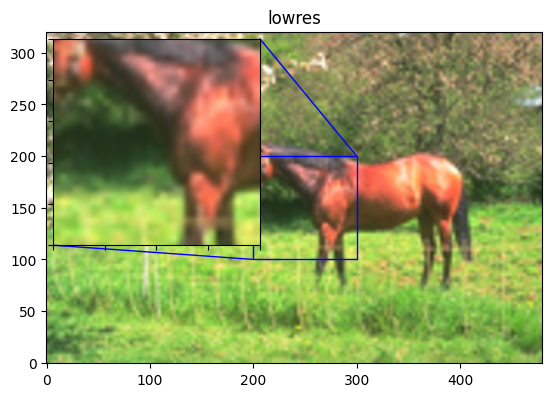

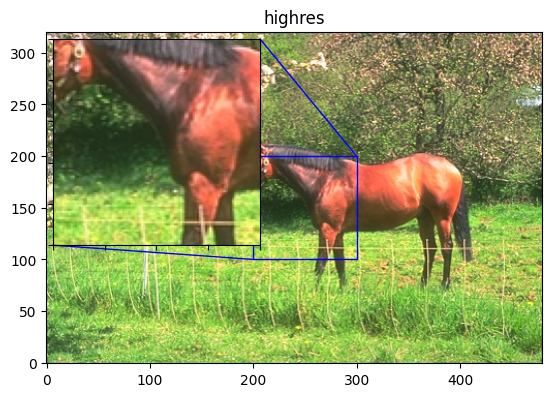

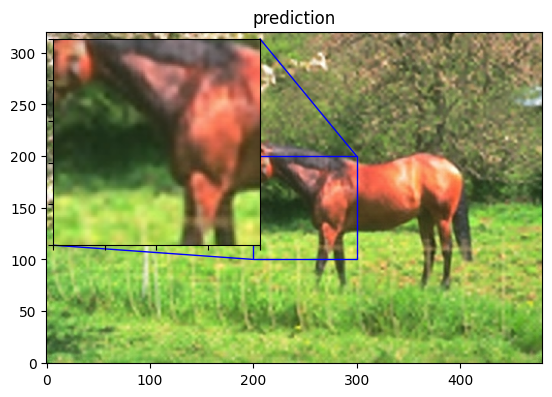

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 26.8615
PSNR of predict and high resolution is 27.0752


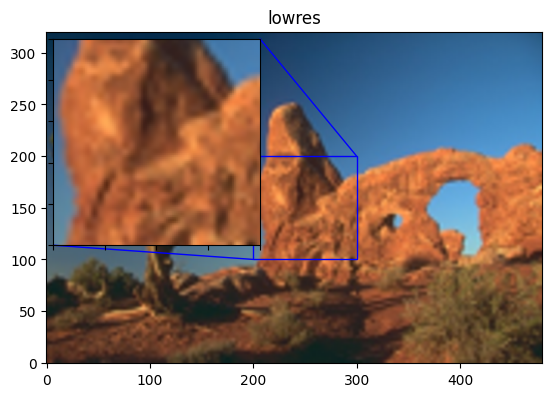

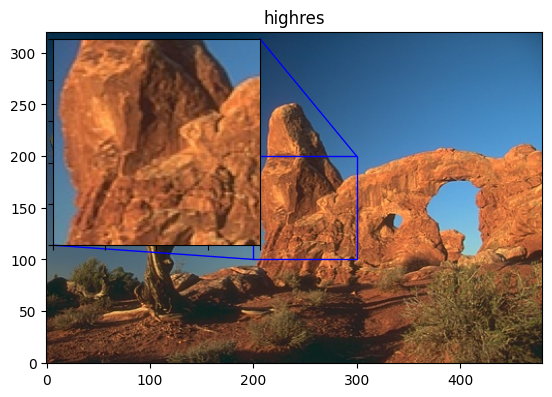

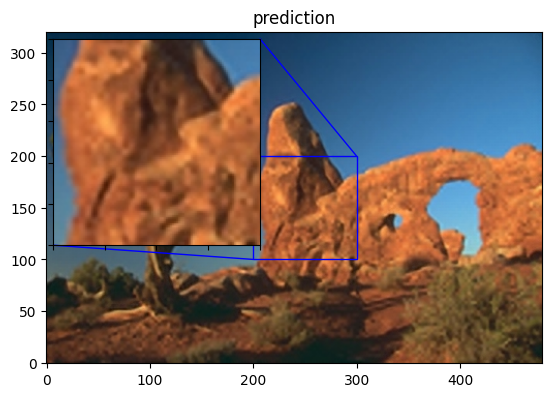

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 31.3140
PSNR of predict and high resolution is 31.0053


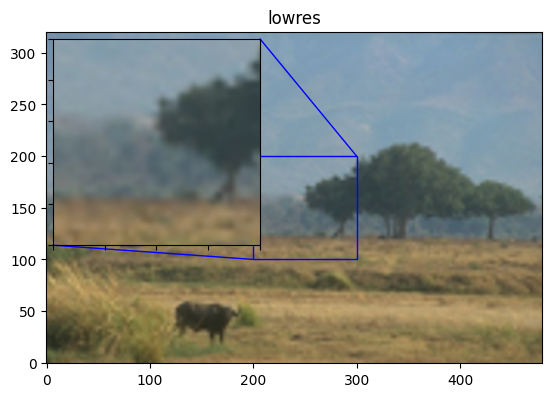

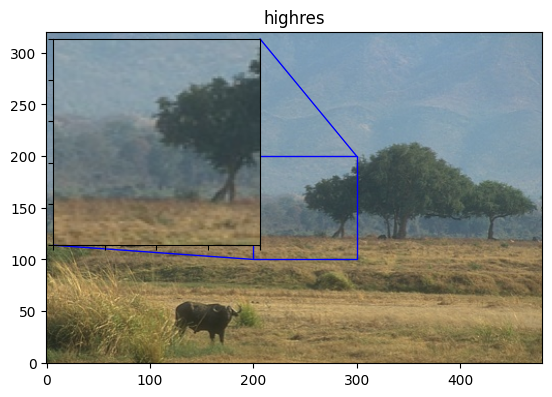

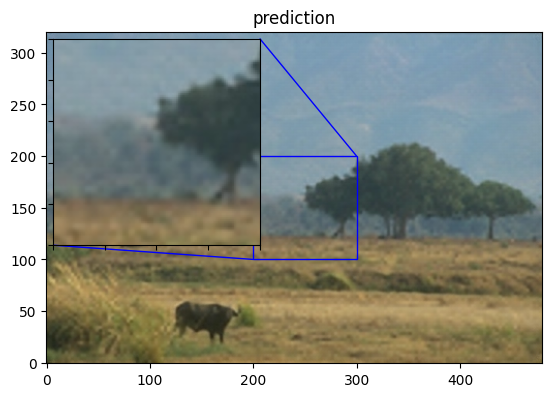

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
PSNR of low resolution image and high resolution image is 29.5956
PSNR of predict and high resolution is 30.0609


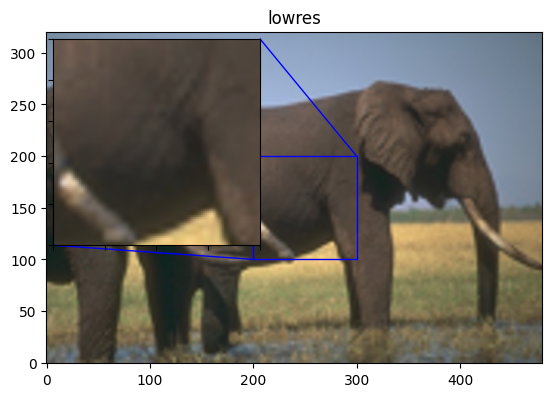

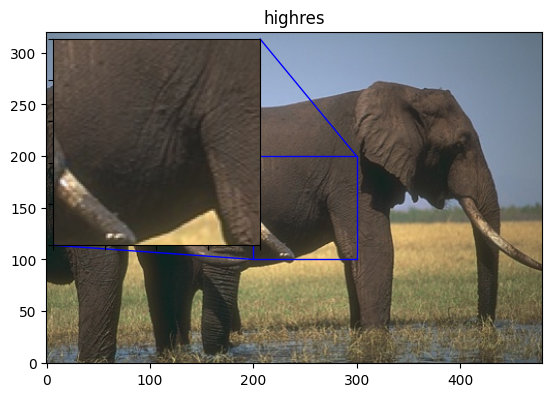

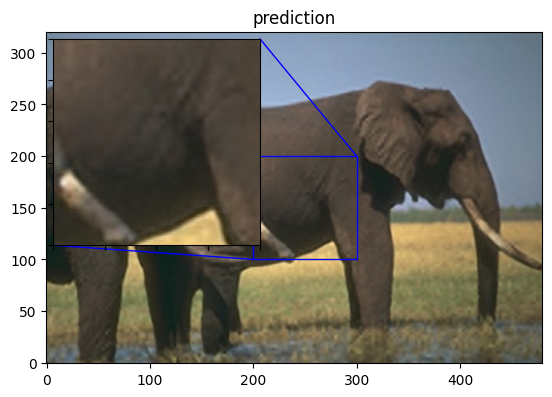

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
PSNR of low resolution image and high resolution image is 31.0349
PSNR of predict and high resolution is 30.9426


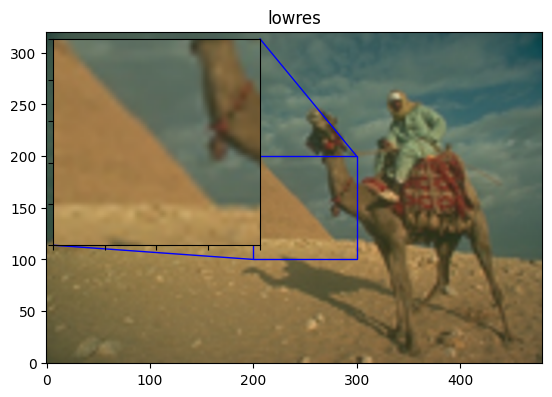

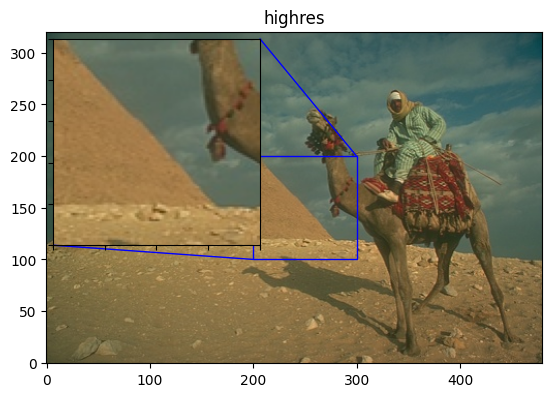

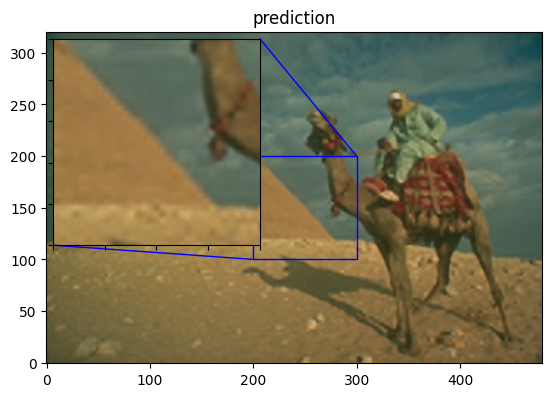

Avg. PSNR of lowres images is 27.5148
Avg. PSNR of reconstructions is 27.7155


In [26]:
total_bicubic_psnr = 0.0
total_test_psnr = 0.0

for index, test_img_path in enumerate(test_img_paths[50:60]):
    img = load_img(test_img_path)
    lowres_input = get_lowres_image(img, upscale_factor)
    w = lowres_input.size[0] * upscale_factor
    h = lowres_input.size[1] * upscale_factor
    highres_img = img.resize((w, h))
    prediction = upscale_image(model, lowres_input)
    lowres_img = lowres_input.resize((w, h))
    lowres_img_arr = img_to_array(lowres_img)
    highres_img_arr = img_to_array(highres_img)
    predict_img_arr = img_to_array(prediction)
    bicubic_psnr = tf.image.psnr(lowres_img_arr, highres_img_arr, max_val=255)
    test_psnr = tf.image.psnr(predict_img_arr, highres_img_arr, max_val=255)

    total_bicubic_psnr += bicubic_psnr
    total_test_psnr += test_psnr

    print(
        "PSNR of low resolution image and high resolution image is %.4f" % bicubic_psnr
    )
    print("PSNR of predict and high resolution is %.4f" % test_psnr)
    plot_results(lowres_img, index, "lowres")
    plot_results(highres_img, index, "highres")
    plot_results(prediction, index, "prediction")

print("Avg. PSNR of lowres images is %.4f" % (total_bicubic_psnr / 10))
print("Avg. PSNR of reconstructions is %.4f" % (total_test_psnr / 10))